In [85]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import LeaveOneOut, cross_val_score
from sklearn.preprocessing import StandardScaler


In [127]:
all_df = pd.read_csv("dl_uk.csv").sample(frac=1)
all_full_df = pd.read_csv("dl_whole.csv")
train_df = pd.read_csv("dl_train.csv")
labels_df = pd.read_csv("dl_status.csv")
labels_df.set_index("LSOA", inplace=True)



First we can try 2 dimensionality reduction techniques, to see if any natural clusters emerge, the successful/unsucessful clubs are in green and red on the plots.

In [10]:
pca_emb = PCA(n_components=2).fit_transform(all_df.drop(columns="LSOA"))

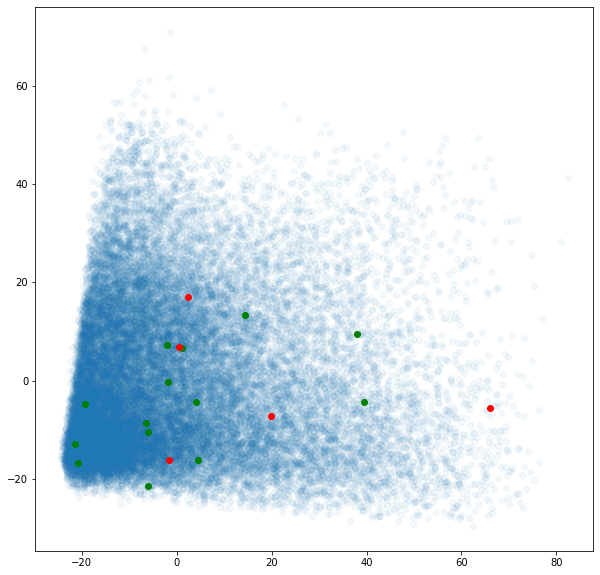

In [44]:
fig = plt.figure(figsize=(10, 10))
plt.scatter(*emb.T, alpha=0.05)
for l in train_df.LSOA:
    idx = all_df.loc[all_df.isin([l]).any(axis=1)].index
    if labels_df.loc[l][0] == 1:
        plt.scatter(*emb[idx].T, c="green", label="1")
    else:
        plt.scatter(*emb[idx].T, c="red", label="0")



Warning TSNE takes a while (~5 mins) to run!

In [16]:
tnse = TSNE(n_components=2, verbose=1).fit(all_df.drop(columns="LSOA"))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 32844 samples in 0.022s...
[t-SNE] Computed neighbors for 32844 samples in 1.813s...
[t-SNE] Computed conditional probabilities for sample 1000 / 32844
[t-SNE] Computed conditional probabilities for sample 2000 / 32844
[t-SNE] Computed conditional probabilities for sample 3000 / 32844
[t-SNE] Computed conditional probabilities for sample 4000 / 32844
[t-SNE] Computed conditional probabilities for sample 5000 / 32844
[t-SNE] Computed conditional probabilities for sample 6000 / 32844
[t-SNE] Computed conditional probabilities for sample 7000 / 32844
[t-SNE] Computed conditional probabilities for sample 8000 / 32844
[t-SNE] Computed conditional probabilities for sample 9000 / 32844
[t-SNE] Computed conditional probabilities for sample 10000 / 32844
[t-SNE] Computed conditional probabilities for sample 11000 / 32844
[t-SNE] Computed conditional probabilities for sample 12000 / 32844
[t-SNE] Computed conditional probabilities for sam

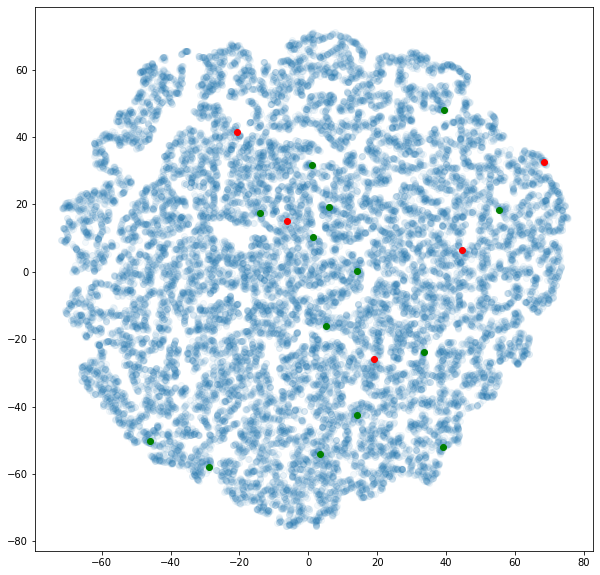

In [46]:
fig = plt.figure(figsize=(10, 10))
plt.scatter(*tnse.embedding_.T, alpha=0.05)
for l in train_df.LSOA:
    idx = all_df.loc[all_df.isin([l]).any(axis=1)].index
    if labels_df.loc[l][0] == 1:
        plt.scatter(*tnse.embedding_[idx].T, c="green", label="1")
    else:
        plt.scatter(*tnse.embedding_[idx].T, c="red", label="0")

Now let's try some predictive models, the results may be a little unhelpful, since we have such a small amount of data.

We can use leave one out cross validation to try and estimate the performence on the test set.

In [57]:
X = np.array(train_df.drop(columns="LSOA"))
y = np.array(labels_df["dl_status"])

In [104]:

classifiers = [DecisionTreeClassifier(), GradientBoostingClassifier(), KNeighborsClassifier(n_neighbors=1),                                     GaussianProcessClassifier(),  LogisticRegression(solver="lbfgs", max_iter=1000)]
norm_classifiers = [Pipeline([("scaler", StandardScaler()), ("clf", clf)]) for clf in classifiers]

for i, clf in enumerate(norm_classifiers):
    cv = cross_val_score(clf, X, y=y, cv=LeaveOneOut(), scoring='accuracy')
    print(f"{type(classifiers[i]).__name__}: {np.mean(cv):.3f} +- {np.std(cv)/np.sqrt(len(cv)):.3f} ")

DecisionTreeClassifier: 0.526 +- 0.115 
GradientBoostingClassifier: 0.526 +- 0.115 
KNeighborsClassifier: 0.579 +- 0.113 
GaussianProcessClassifier: 0.579 +- 0.113 
LogisticRegression: 0.579 +- 0.113 


The Gaussian process is a probabilisitic model, so we can get acess to the probability that each new LSOA will be sucessful or not, instead of just a 1 or 0.

Let's find the 10 most likely LSOAs to be sucessful.

In [165]:
gp = Pipeline([("scaler", StandardScaler()), ("clf", GaussianProcessClassifier())])
gp.fit(X, y)

pred_df = all_df.drop(index=all_df[all_df["LSOA"].isin(train_df["LSOA"])].index)
pred_df["Prob 1"] = gp.predict_proba(pred_df.drop(columns="LSOA"))[:, 1]

In [179]:
top_df = pred_df.sort_values(by="Prob 1", ascending=False).head(n=10)
toplsoa = top_df.LSOA
topnames=  all_full_df.loc[all_full_df['LSOA code (2011)'].isin(toplsoa)]["LSOA name (2011)"]

In [192]:
final_df =top_df[["LSOA", 'Prob 1']]
final_df["Names"] = topnames.tolist()
final_df

ipykernel_launcher:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,LSOA,Prob 1,Names
28087,E01028818,0.589396,Swindon 001B
14529,E01014975,0.587777,North Hertfordshire 004B
15063,E01015520,0.584917,St Albans 002A
22967,E01023588,0.584470,Maidstone 017B
23782,E01024425,0.584085,Sevenoaks 014A
17665,E01018189,0.584030,West Oxfordshire 010E
14009,E01014423,0.583733,Horsham 003A
23725,E01024365,0.580876,Bath and North East Somerset 025D
23063,E01023685,0.578762,South Gloucestershire 026E
30831,E01031620,0.578050,Huntingdonshire 019C




### TODO
- [x] Nearest neighbours 
- [x] Logistic regression
- [x] GP 
- [x] test all with LOO cross validation
- [ ] BayesOPT